# Participative media and volumetric rendering using `transient_prbvolpath`

## Overview
In this tutorial, you will modify the scene from `0-render_cbox_diffuse.ipynb` so that the cubes in the Cornell Box have participating media inside (i.e. cubes filled with smoke).

<div class="admonition important alert alert-block alert-warning">

This tutorial assumes that you've read `0-render_cbox_diffuse.ipynb`. Most of the setup/visualization code is the same. Here you get to see some cool specular reflections in the rendered video though :)

</div>

<div class="admonition important alert alert-block alert-success">

🚀 **You will learn how to:**

<ul>
  <li>
  
  Edit the scene to add participating media, and render using the `transient_prbvolpath` integrator</li>
  <li>
  
  Visualize the edited scene</li>
</ul>

</div>

In [1]:
# If you have compiled Mitsuba 3 yourself, you will need to specify the path
# to the compilation folder
# import sys
# sys.path.insert(0, '<mitsuba-path>/mitsuba3/build/python')
import mitsuba as mi
# To set a variant, you need to have set it in the mitsuba.conf file
# https://mitsuba.readthedocs.io/en/latest/src/key_topics/variants.html
mi.set_variant('llvm_ad_rgb')

import mitransient as mitr

print('Using mitsuba version:', mi.__version__)
print('Using mitransient version:', mitr.__version__)

Using mitsuba version: 3.6.4
Using mitransient version: 1.2.0


We use the short alias `mitr` for `mitransient` for improved code readibility.

### Editing the Cornell Box scene

In this case we provide a `cbox_volumetric.xml` that we will load with `mi.load_file`. The necessary changes are:

```diff
<shape type="obj" id="smallbox">
  <string name="filename" value="meshes/cbox_smallbox.obj"/>
-   <ref id="gray"/>
+   <bsdf type="null" />
+   <medium type="homogeneous" name="interior">
+     <rgb name="albedo" value="0.99, 0.4, 0.46"/>
+     <float name="sigma_t" value="0.05"/>
+     <phase type="hg">
+       <float name="g" value="0.1"/>
+     </phase>
+   </medium>
</shape> 
```

In summary:
1. We change the "gray" BSDF with a "null" BSDF. This means that, when a ray hits the box it will go inside and not reflect as it would do with a gray diffuse surface.
2. We add a homogeneous medium. For the details of all the variables and configuration you can [check Mitsuba's documentation](https://mitsuba.readthedocs.io/en/stable/src/generated/plugins_media.html). The text above shows the changes for `smallbox` which has red albedo. Note that the `largebox` also has a different medium with blue albedo.

In [2]:
# Load XML file
# You can also use mi.load_dict and pass a Python dict object
# but it is probably much easier for your work to use XML files
import os
scene = mi.load_file(os.path.abspath('cornell-box/cbox_volumetric.xml'))

### Render and visualization

This uses the same methods as in the previous notebook.

In [3]:
data_steady, data_transient = mi.render(scene, spp=1024)
print(data_steady.shape, data_transient.shape)

(256, 256, 3) (256, 256, 400, 3)


<div class="admonition important alert alert-block alert-warning">
Note that this function will take longer to execute, as it's doing the rendering job (lazy evaluation)
</div>

In [4]:
# Plot the computed steady image
mi.util.convert_to_bitmap(data_steady)

Bitmap[
  pixel_format = rgb,
  component_format = uint8,
  size = [256, 256],
  srgb_gamma = 1,
  struct = Struct<3>[
    uint8 R; // @0, normalized, gamma, premultiplied alpha
    uint8 G; // @1, normalized, gamma, premultiplied alpha
    uint8 B; // @2, normalized, gamma, premultiplied alpha
  ],
  data = [ 192 KiB of image data ]
]

In [5]:
# Plot the computed transient image as a video
data_transient_tonemapped = mitr.vis.tonemap_transient(data_transient)

mitr.vis.show_video(
    data_transient_tonemapped,
    axis_video=2,
)

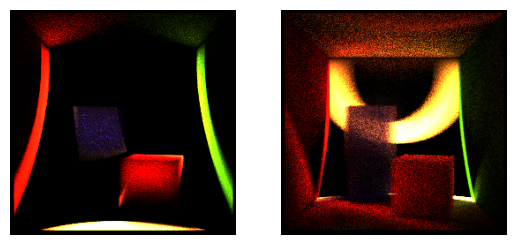

In [6]:
# Plot some frames of the computed transient image
import matplotlib.pyplot as plt

data_transient_tonemapped[data_transient_tonemapped > 1] = 1

plt.subplot(1, 2, 1)
plt.axis("off")
plt.imshow(data_transient_tonemapped[:, :, 72])
plt.subplot(1, 2, 2)
plt.axis("off")
plt.imshow(data_transient_tonemapped[:, :, 120])
plt.show()